In [1]:
import anndata
import matplotlib.pyplot as plt
import numpy as np
import scanpy as sc
from scipy.stats import spearmanr
from scvi.data import cortex, smfish
from scvi.external import GIMVI
import os
import pandas as pd
from sklearn.neighbors import KDTree
from tqdm.notebook import tqdm
from collections import Counter
from sklearn.neighbors import KDTree

/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (


# Proceed right after notebook 6_2

In [2]:
train_size = 1

%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}
%config InlineBackend.figure_format='retina'
#set scvi seed
np.random.seed(0)

In [3]:
data_path = '../../data'
output_folder = '../../outputs'

try:
    os.mkdir(os.path.join(data_path, 'integration'))
except FileExistsError:
    pass

In [4]:
file=os.path.join(output_folder, 'adatas', "joint_embedded_R_for_transfer.h5ad")
spatial_data= sc.read(file)

/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [5]:
seq_file = os.path.join(data_path, 'temp_objects', 'AvrRpt2_alone2.h5ad')
seq_data = sc.read(seq_file)
seq_data = seq_data[seq_data.obs['sample.order'].isin(['00_00_Mock_rep1', '02_AvrRpt2_04h_rep1', '02_AvrRpt2_06h_rep1', '02_AvrRpt2_09h_rep1', '02_AvrRpt2_24h_rep1'])]
seq_data.obs['sample.order'] = seq_data.obs['sample.order'].replace('00_00_Mock_rep1', 'mock').replace('02_AvrRpt2_04h_rep1', '4hr_avr').replace('02_AvrRpt2_06h_rep1', '6hr_avr').replace('02_AvrRpt2_09h_rep1', '9hr_avr').replace('02_AvrRpt2_24h_rep1', 'avrrpt24')

/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/tmp/ipykernel_2347615/2589845308.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  seq_data.obs['sample.order'] = seq_data.obs['sample.order'].replace('00_00_Mock_rep1', 'mock').replace('02_AvrRpt2_04h_rep1', '4hr_avr').replace('02_AvrRpt2_06h_rep1', '6hr_avr').replace('02_AvrRpt2_09h_rep1', '9hr_avr').replace('02_AvrRpt2_24h_rep1', 'avrrpt24')


In [6]:
intersection = []
non_intersecting = []
for k in spatial_data.var_names:
    if k in seq_data.var_names:
        intersection.append(k)
    else:
        non_intersecting.append(k)

In [7]:
# only use genes in both datasets
seq_data = seq_data[:, intersection].copy()
spatial_data = spatial_data[:, intersection].copy()

In [8]:
def index_nomenclature_alignment(index):
    return [i.replace('00_col_Mock_rep1', '00_Mock').replace('col_AvrRpt2_24h_rep1', 'AvrRpt2_24h').replace('col_AvrRpt2_04h_rep1', 'AvrRpt2_04h').replace('col_AvrRpt2_06h_rep1', 'AvrRpt2_06h').replace('col_AvrRpt2_09h_rep1', 'AvrRpt2_09h') for i in index]

In [9]:
def add_pseudotime_to_seq_data(pseudotime_path, seq_data):
    rep1_pseudotime = pd.read_csv(pseudotime_path)

    seq_data_with_pseudotime = seq_data.copy()
    seq_data_with_pseudotime.obs.index = index_nomenclature_alignment(seq_data_with_pseudotime.obs.index)

    new_df = seq_data_with_pseudotime.obs.merge(rep1_pseudotime, how='left', left_index=True, right_on='index')
    new_df.index = new_df['index']
    new_df['dpt_pseudotime'] = new_df['dpt_pseudotime'].fillna(0)
    seq_data_with_pseudotime.obs = new_df

    return seq_data_with_pseudotime

In [10]:
pseudotime_path = os.path.join(data_path, 'temp_objects', 'pseudotime_csv.csv')

seq_data_with_pseudotime = add_pseudotime_to_seq_data(pseudotime_path, seq_data)

In [11]:
seq_data_samples = ['00_Mock', 'AvrRpt2_04h', 'AvrRpt2_06h', 'AvrRpt2_09h', 'AvrRpt2_24h']
spatial_data_samples = ['mock', '4hr_avr', '6hr_avr', '9hr_avr', 'avrrpt24']

In [12]:
def prepare_and_run_GIMVI(current_seq_experiment, current_spatial_experiment, train_size=1, n_epochs=200, n_latent=10):
    
    seq_gene_names = current_seq_experiment.var_names
    n_genes = current_seq_experiment.n_vars
    n_train_genes = int(n_genes * train_size)

    # randomly select training_genes
    rand_train_gene_idx = np.random.choice(range(n_genes), n_train_genes, replace=False)
    rand_test_gene_idx = sorted(set(range(n_genes)) - set(rand_train_gene_idx))
    rand_train_genes = seq_gene_names[rand_train_gene_idx]
    rand_test_genes = seq_gene_names[rand_test_gene_idx]

    # current_spatial_experiment_partial has a subset of the genes to train on
    #current_spatial_experiment_partial = current_spatial_experiment[:, rand_train_genes].copy()

    # remove cells with no counts
    sc.pp.filter_cells(current_spatial_experiment, min_counts=1)
    sc.pp.filter_cells(current_seq_experiment, min_counts=1)

    # setup_anndata for spatial and sequencing data
    GIMVI.setup_anndata(current_spatial_experiment, labels_key="leiden", batch_key="batch")
    GIMVI.setup_anndata(current_seq_experiment, labels_key='SCT_snn_res.1', batch_key='sample.order')

    # create our model
    model = GIMVI(current_seq_experiment, current_spatial_experiment, n_latent = 10)

    # train for 200 epochs
    model.train(200)

    # get the latent representations for the sequencing and spatial data
    latent_seq, latent_spatial = model.get_latent_representation()

    # concatenate to one latent representation
    latent_representation = np.concatenate([latent_seq, latent_spatial])
    latent_adata = anndata.AnnData(latent_representation)

    # labels which cells were from the sequencing dataset and which were from the spatial dataset
    latent_labels = (["seq"] * latent_seq.shape[0]) + (
        ["spatial"] * latent_spatial.shape[0]
    )
    latent_adata.obs["labels"] = latent_labels

    # compute umap
    sc.pp.neighbors(latent_adata, use_rep="X")
    sc.tl.umap(latent_adata)


    # save umap representations to original seq and current_spatial_experimentsets
    current_seq_experiment.obsm["X_umap_gimvi"] = latent_adata.obsm["X_umap"][: current_seq_experiment.shape[0]]
    current_spatial_experiment.obsm["X_umap_gimvi"] = latent_adata.obsm["X_umap"][current_seq_experiment.shape[0] :]

    seq_latent = model.get_latent_representation()[0]

    current_seq_experiment.obsm['X_gimvi'] = seq_latent
    current_spatial_experiment.obsm['X_gimvi'] = model.get_latent_representation()[1]

    sc.pp.neighbors(latent_adata, use_rep="X", n_neighbors=30)
    sc.tl.umap(latent_adata, min_dist=0.1)

    # save umap representations to original seq and current_spatial_experimentsets
    current_seq_experiment.obsm["X_umap_gimvi"] = latent_adata.obsm["X_umap"][: current_seq_experiment.shape[0]]
    current_spatial_experiment.obsm["X_umap_gimvi"] = latent_adata.obsm["X_umap"][current_seq_experiment.shape[0] :]

    sc.pl.embedding(latent_adata, basis='X_umap', color='labels')

    return current_seq_experiment, current_spatial_experiment, latent_adata, model

def impute_pseudotime(latent_adata, single_experiment_seq_data, current_spatial_experiment, n_neighbors=10):

    # Assuming your original AnnData object is named 'adata'
    adata = latent_adata.copy()

    # Step 1: Filter spatial and seq cells
    spatial_cells = adata[adata.obs['labels'] == 'spatial'].copy()
    seq_cells = adata[adata.obs['labels'] == 'seq'].copy()
    single_experiment_seq_data_copy = single_experiment_seq_data.copy()

    # Step 2: Create KD tree for seq cells
    seq_gimvi = single_experiment_seq_data.obsm['X_gimvi']
    kdtree = KDTree(seq_gimvi)

    # Step 3: Find nearest seq cells for each seq
    distances, indices = kdtree.query(current_spatial_experiment.obsm['X_gimvi'], k=n_neighbors)

    # Step 4: Average gene expression for spatial cells
    averaged_expression = np.zeros((spatial_cells.n_obs, 1))

    for i in tqdm(range(spatial_cells.n_obs)):
        seq_neighbors_indices = indices[i]
        seq_neighbors_expression = single_experiment_seq_data_copy.obs['dpt_pseudotime'].values[seq_neighbors_indices]
        
        averaged_expression[i] = np.mean(seq_neighbors_expression, axis=0)

    pseudotime = averaged_expression.flatten()

    return pseudotime

def impute_celltype(latent_adata, single_experiment_seq_data, spatial_data, n_neighbors=10):
    # Assuming your original AnnData object is named 'adata'
    adata = latent_adata.copy()

    # Step 1: Filter spatial and seq cells
    spatial_cells = adata[adata.obs['labels'] == 'spatial'].copy()
    seq_cells = adata[adata.obs['labels'] == 'seq'].copy()
    single_experiment_seq_data_copy = single_experiment_seq_data.copy()

    # Step 2: Create KD tree for seq cells
    seq_gimvi = single_experiment_seq_data.obsm['X_gimvi']
    kdtree = KDTree(seq_gimvi)

    # Step 3: Find nearest seq cells for each seq
    n_neighbors = 30  # Specify the number of nearest neighbors
    distances, indices = kdtree.query(spatial_data.obsm['X_gimvi'], k=n_neighbors)

    # Step 4: Average gene expression for spatial cells
    averaged_expression = np.zeros((spatial_cells.n_obs, 1))
    average_celltype = []

    for i in tqdm(range(spatial_cells.n_obs)):
        seq_neighbors_indices = indices[i]
        seq_neighbors_categories = single_experiment_seq_data_copy.obs['SCT_snn_res.1'].values[seq_neighbors_indices]

        # Use Counter to count occurrences
        counter = Counter(seq_neighbors_categories)

        # Find the most common element
        most_common = counter.most_common(1)

        averaged_expression[i] = most_common[0][0]

        seq_neighbors_categories = single_experiment_seq_data_copy.obs['celltype'].values[seq_neighbors_indices]

        # Use Counter to count occurrences
        counter = Counter(seq_neighbors_categories)

        # Find the most common element
        most_common = counter.most_common(1)

        average_celltype.append(most_common[0][0])

    clustering = averaged_expression.flatten().astype(int).astype(str)

    return clustering, average_celltype

0


/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:137: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_counts'] = number
/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:137: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_counts'] = number
/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)
/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packag

Epoch 1/200:   0%|          | 0/200 [00:00<?, ?it/s]

/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)


Epoch 200/200: 100%|██████████| 200/200 [06:30<00:00,  1.96s/it, v_num=1]

`Trainer.fit` stopped: `max_epochs=200` reached.


Epoch 200/200: 100%|██████████| 200/200 [06:30<00:00,  1.95s/it, v_num=1]


/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


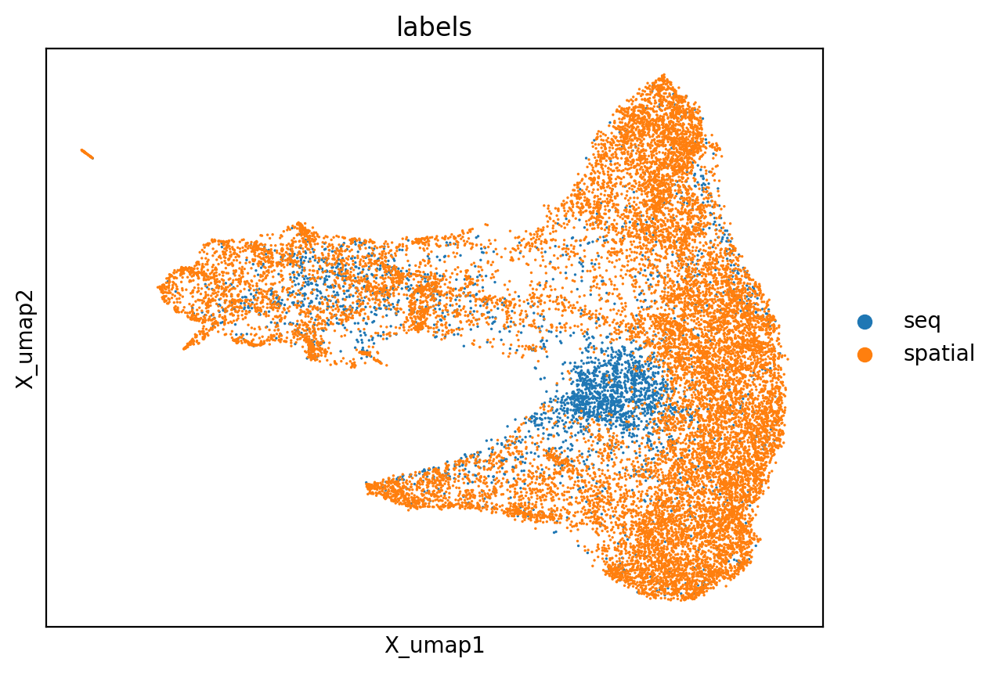

/tmp/ipykernel_2347615/270623234.py:21: ImplicitModificationWarning: Setting element `.obsm['X_gimvi']` of view, initializing view as actual.
  single_experiment_seq_data.obsm['X_gimvi'] = current_seq_experiment.obsm['X_gimvi']


  0%|          | 0/16775 [00:00<?, ?it/s]

  0%|          | 0/16775 [00:00<?, ?it/s]

/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


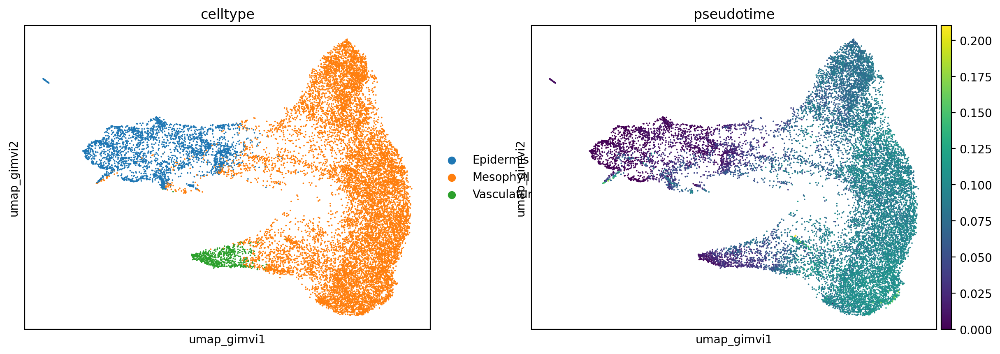

/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:137: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_counts'] = number
/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:137: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_counts'] = number
/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scvi/data/fields/_dataframe_field.py:189: UserWarning: Category 7 in adata.obs['_scvi_labels'] has fewer than 3 cells. Models may not train properly.
  categorical_mapping = _make_column_categorical(
GPU availa

1
Epoch 200/200: 100%|██████████| 200/200 [07:07<00:00,  1.93s/it, v_num=1]

`Trainer.fit` stopped: `max_epochs=200` reached.


Epoch 200/200: 100%|██████████| 200/200 [07:07<00:00,  2.14s/it, v_num=1]


/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


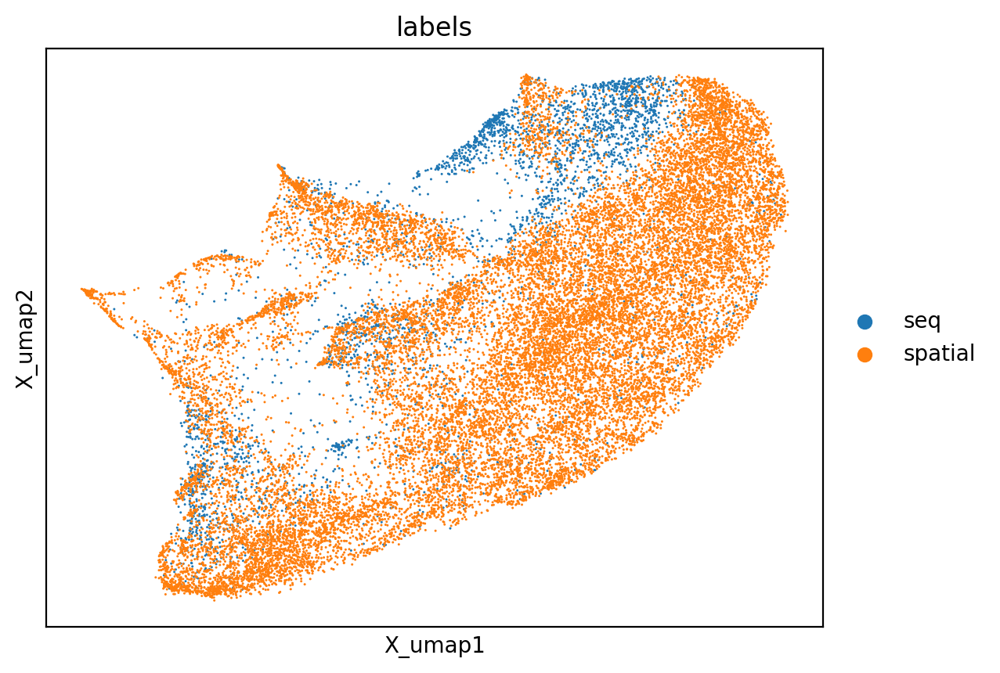

/tmp/ipykernel_2347615/270623234.py:21: ImplicitModificationWarning: Setting element `.obsm['X_gimvi']` of view, initializing view as actual.
  single_experiment_seq_data.obsm['X_gimvi'] = current_seq_experiment.obsm['X_gimvi']


  0%|          | 0/22095 [00:00<?, ?it/s]

  0%|          | 0/22095 [00:00<?, ?it/s]

/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


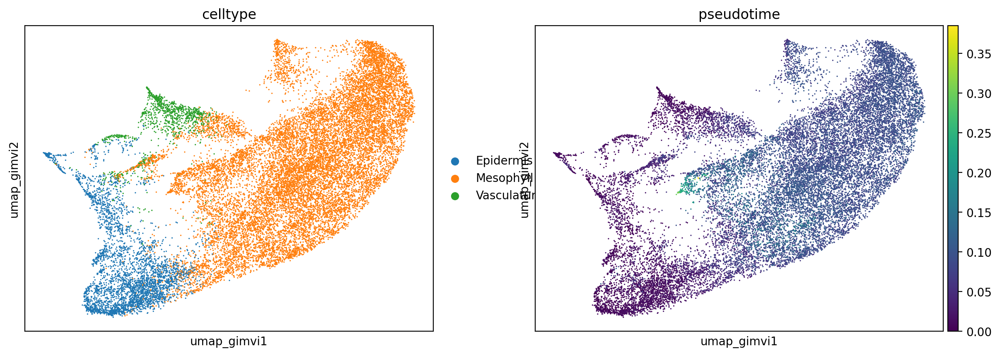

/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:137: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_counts'] = number
/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:137: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_counts'] = number
/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scvi/data/fields/_dataframe_field.py:189: UserWarning: Category 9 in adata.obs['_scvi_labels'] has fewer than 3 cells. Models may not train properly.
  categorical_mapping = _make_column_categorical(
GPU availa

2
Epoch 200/200: 100%|██████████| 200/200 [05:09<00:00,  1.34s/it, v_num=1]

`Trainer.fit` stopped: `max_epochs=200` reached.


Epoch 200/200: 100%|██████████| 200/200 [05:09<00:00,  1.55s/it, v_num=1]


/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


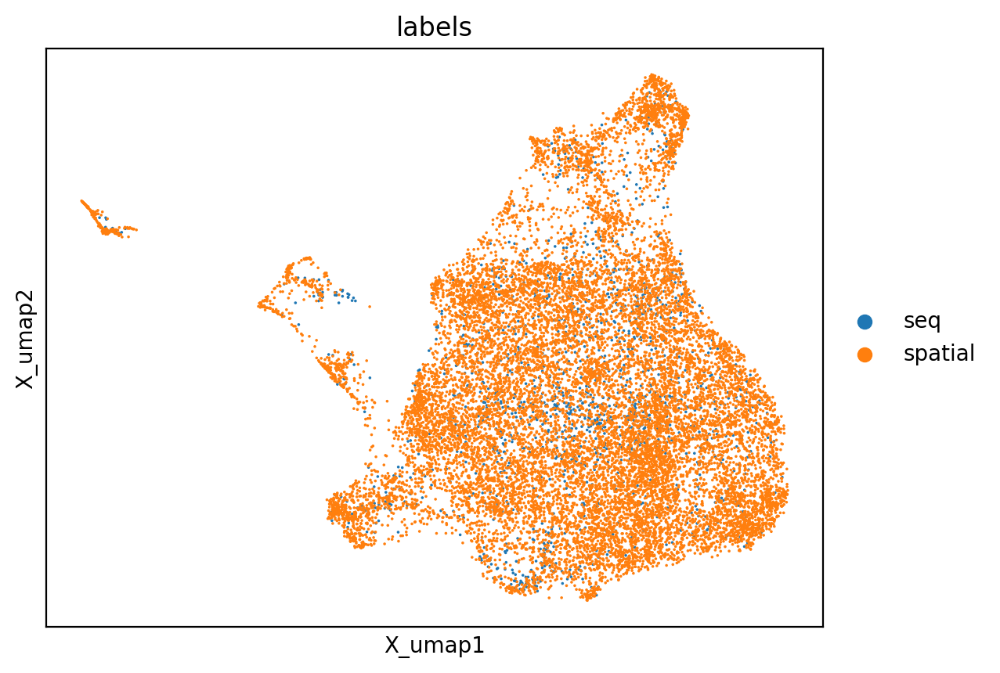

/tmp/ipykernel_2347615/270623234.py:21: ImplicitModificationWarning: Setting element `.obsm['X_gimvi']` of view, initializing view as actual.
  single_experiment_seq_data.obsm['X_gimvi'] = current_seq_experiment.obsm['X_gimvi']


  0%|          | 0/16291 [00:00<?, ?it/s]

  0%|          | 0/16291 [00:00<?, ?it/s]

/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


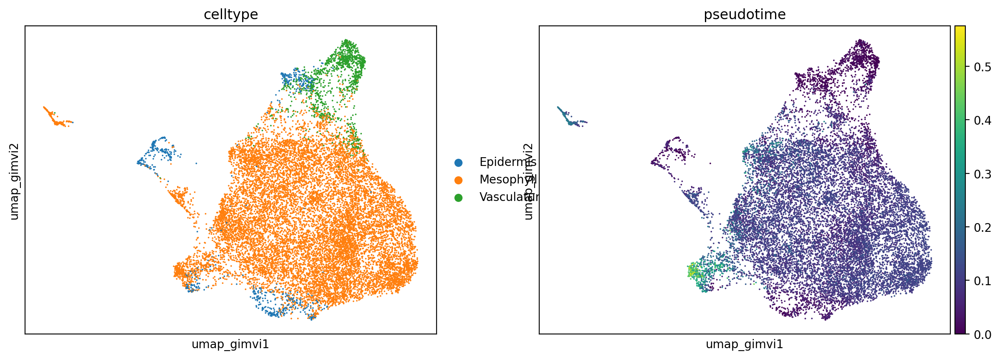

/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:137: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_counts'] = number
/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:137: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_counts'] = number
/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


3
Epoch 200/200: 100%|██████████| 200/200 [11:16<00:00,  4.23s/it, v_num=1]

`Trainer.fit` stopped: `max_epochs=200` reached.


Epoch 200/200: 100%|██████████| 200/200 [11:16<00:00,  3.38s/it, v_num=1]


/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


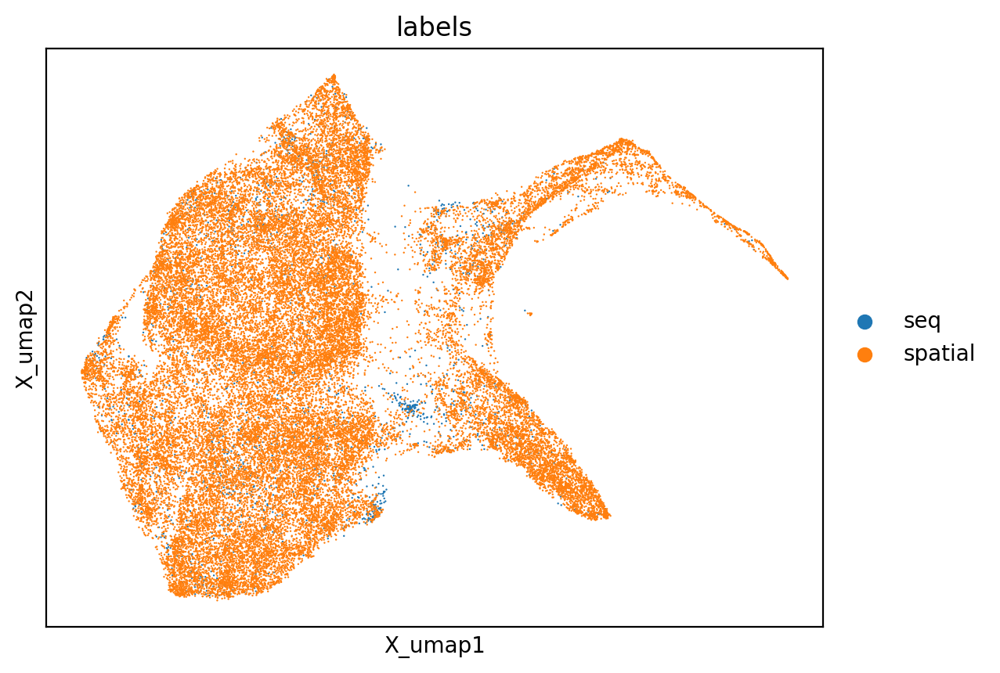

/tmp/ipykernel_2347615/270623234.py:21: ImplicitModificationWarning: Setting element `.obsm['X_gimvi']` of view, initializing view as actual.
  single_experiment_seq_data.obsm['X_gimvi'] = current_seq_experiment.obsm['X_gimvi']


  0%|          | 0/38528 [00:00<?, ?it/s]

  0%|          | 0/38528 [00:00<?, ?it/s]

/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


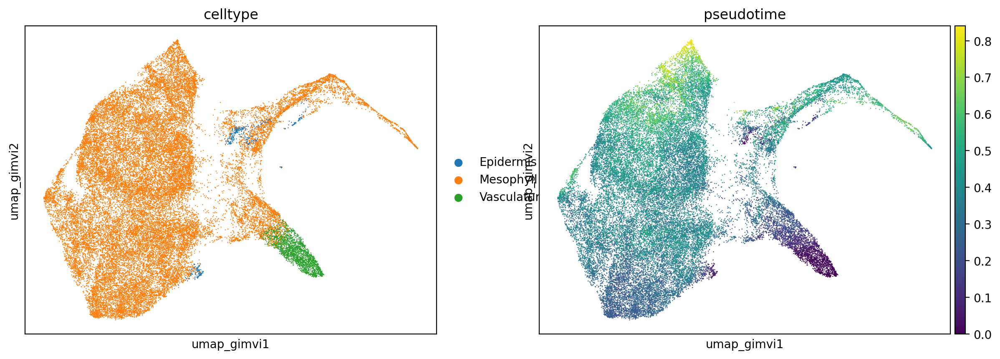

/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:137: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_counts'] = number
/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:137: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_counts'] = number
/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scvi/data/fields/_dataframe_field.py:189: UserWarning: Category 8 in adata.obs['_scvi_labels'] has fewer than 3 cells. Models may not train properly.
  categorical_mapping = _make_column_categorical(
GPU availa

4


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 200/200: 100%|██████████| 200/200 [10:50<00:00,  3.15s/it, v_num=1]

`Trainer.fit` stopped: `max_epochs=200` reached.


Epoch 200/200: 100%|██████████| 200/200 [10:50<00:00,  3.25s/it, v_num=1]


/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


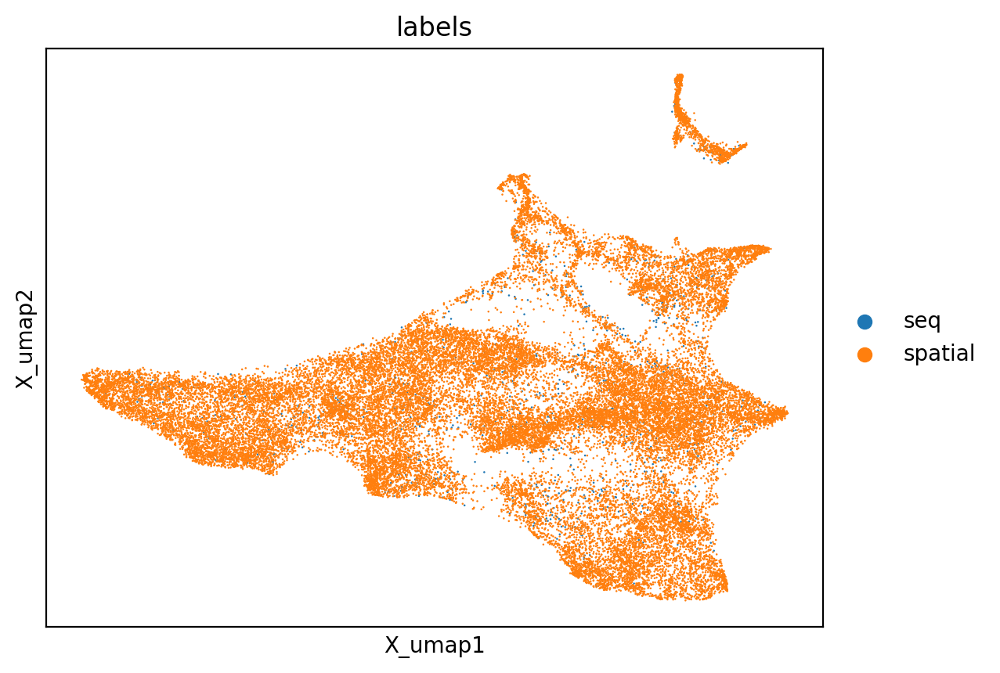

/tmp/ipykernel_2347615/270623234.py:21: ImplicitModificationWarning: Setting element `.obsm['X_gimvi']` of view, initializing view as actual.
  single_experiment_seq_data.obsm['X_gimvi'] = current_seq_experiment.obsm['X_gimvi']


  0%|          | 0/34743 [00:00<?, ?it/s]

  0%|          | 0/34743 [00:00<?, ?it/s]

/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/amonell/mambaforge/envs/scvi-env_gpu/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


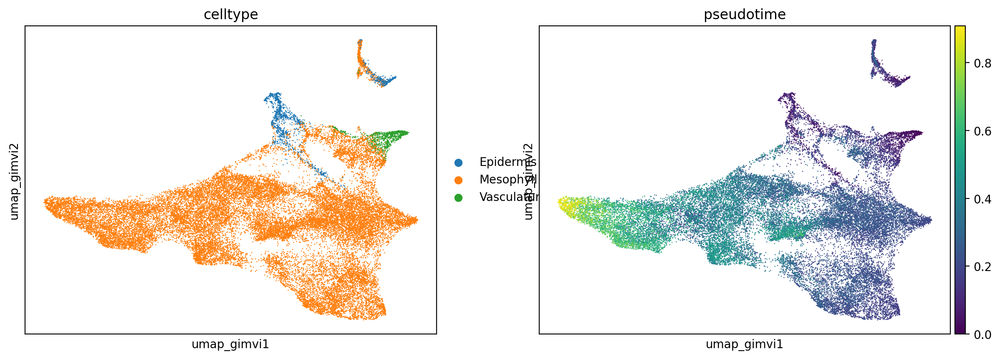

In [13]:
for samp in range(len(seq_data_samples)):
    print(samp)
    current_seq_sample = seq_data_samples[samp]
    current_spatial_sample = spatial_data_samples[samp]

    current_seq_experiment = seq_data[seq_data.obs['sample2'] == current_seq_sample]
    current_spatial_experiment = spatial_data[spatial_data.obs['batch'] == current_spatial_sample]


    current_seq_experiment, current_spatial_experiment, latent_adata, model = prepare_and_run_GIMVI(current_seq_experiment, current_spatial_experiment, train_size=train_size, n_epochs=200, n_latent=10)


    single_experiment_seq_data = seq_data_with_pseudotime[seq_data_with_pseudotime.obs['sample2'] == current_seq_sample]

    current_seq_experiment.obs.index = index_nomenclature_alignment(current_seq_experiment.obs.index)

    current_seq_experiment = current_seq_experiment[current_seq_experiment.obs.index.isin(single_experiment_seq_data.obs.index)]

    single_experiment_seq_data = single_experiment_seq_data[single_experiment_seq_data.obs.index.isin(current_seq_experiment.obs.index)]

    single_experiment_seq_data.obsm['X_gimvi'] = current_seq_experiment.obsm['X_gimvi']

    single_experiment_seq_data.obsm["X_umap_gimvi"] = current_seq_experiment.obsm["X_umap_gimvi"]
    
    current_spatial_experiment.obs['pseudotime'] = impute_pseudotime(latent_adata, single_experiment_seq_data, current_spatial_experiment, n_neighbors=10)

    clustering, average_celltype = impute_celltype(latent_adata, single_experiment_seq_data, current_spatial_experiment, n_neighbors=20)
    current_spatial_experiment.obs['SCT_snn_res.1'] = clustering
    current_spatial_experiment.obs['celltype'] = average_celltype

    curr_directory = os.path.join(data_path, 'integration', current_spatial_sample)

    try:
        os.mkdir(curr_directory)
    except FileExistsError:
        pass

    latent_adata.write(os.path.join(curr_directory, 'latent_adata.h5ad'))
    current_spatial_experiment.write(os.path.join(curr_directory, 'spatial_data.h5ad'))
    single_experiment_seq_data.write(os.path.join(curr_directory, 'seq_data.h5ad'))

    sc.pl.embedding(current_spatial_experiment, basis='umap_gimvi',color=['celltype', 'pseudotime'])

### Transferring gene expression

In [171]:
seq_file = '/projects/Alex/Spatiotemporal_Atlas_Ecker/data/AvrRpt2_alone.h5ad'
seq_data_copy = sc.read(seq_file)
seq_data_copy = seq_data_copy[seq_data_copy.obs['sample.order'].isin(['00_00_Mock_rep1', '02_AvrRpt2_04h_rep1', '02_AvrRpt2_06h_rep1', '02_AvrRpt2_09h_rep1', '02_AvrRpt2_24h_rep1'])]
seq_data_copy.obs['sample.order'] = seq_data_copy.obs['sample.order'].replace('00_00_Mock_rep1', 'mock').replace('02_AvrRpt2_04h_rep1', '4hr_avr').replace('02_AvrRpt2_06h_rep1', '6hr_avr').replace('02_AvrRpt2_09h_rep1', '9hr_avr').replace('02_AvrRpt2_24h_rep1', 'avrrpt24')
seq_data_copy.obs.index = [i.replace('00_col_Mock_rep1', '00_Mock').replace('col_AvrRpt2_24h_rep1', 'AvrRpt2_24h').replace('col_AvrRpt2_04h_rep1', 'AvrRpt2_04h').replace('col_AvrRpt2_06h_rep1', 'AvrRpt2_06h').replace('col_AvrRpt2_09h_rep1', 'AvrRpt2_09h') for i in seq_data_copy.obs.index]

/home/amonell/mambaforge/envs/scvi-env/lib/python3.9/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/tmp/ipykernel_361611/3242676731.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  seq_data_copy.obs['sample.order'] = seq_data_copy.obs['sample.order'].replace('00_00_Mock_rep1', 'mock').replace('02_AvrRpt2_04h_rep1', '4hr_avr').replace('02_AvrRpt2_06h_rep1', '6hr_avr').replace('02_AvrRpt2_09h_rep1', '9hr_avr').replace('02_AvrRpt2_24h_rep1', 'avrrpt24')


In [172]:
seq_data_copy.X = seq_data_copy.X.A

In [176]:
indices_match = [np.where(seq_data_copy.obs.index.values == seq_data.obs.index.values[i])[0][0] for i in range(len(seq_data.obs.index.values))]

In [177]:
seq_data_copy = seq_data_copy[indices_match, :]

In [201]:


# Assuming your original AnnData object is named 'adata'
adata = latent_adata.copy()

# Step 1: Filter spatial and seq cells
spatial_cells = adata[adata.obs['labels'] == 'spatial'].copy()
seq_cells = adata[adata.obs['labels'] == 'seq'].copy()


# Step 2: Create KD tree for seq cells
seq_gimvi = seq_data.obsm['X_gimvi']
kdtree = KDTree(seq_gimvi)

# Step 3: Find nearest seq cells for each seq
n_neighbors = 30  # Specify the number of nearest neighbors
distances, indices = kdtree.query(spatial_data.obsm['X_gimvi'], k=n_neighbors)

# Step 4: Average gene expression for spatial cells
averaged_expression = np.zeros((spatial_cells.n_obs, len(seq_data_copy.X[0])))
for i in tqdm(range(spatial_cells.n_obs)):
    seq_neighbors_indices = indices[i]
    seq_neighbors_expression = seq_data_copy.X[seq_neighbors_indices]
    averaged_expression[i] = np.mean(seq_neighbors_expression, axis=0)

  0%|          | 0/129733 [00:00<?, ?it/s]

In [202]:
gene_to_impute = 'BON3'
spatial_data.obs['current_imputed'] = averaged_expression[:, np.where(seq_data_copy.var.index == gene_to_impute)[0][0]]

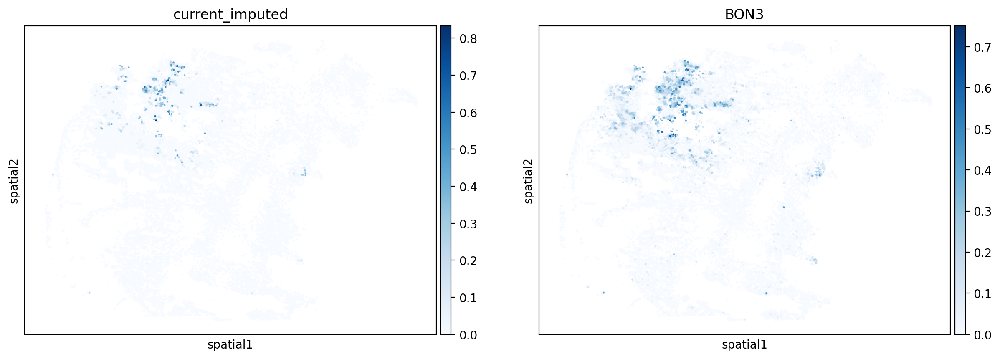

In [203]:
sc.pl.embedding(spatial_data[spatial_data.obs['batch'] == 'avrrpt24'], basis='spatial', color=['current_imputed', 'BON3'], cmap='Blues', size=10)

### Saving out for figures and CSIDE

In [295]:
latent_adata.write('/projects/Alex/Spatiotemporal_Atlas_Ecker/data/integration/latent_adata.h5ad')
spatial_data.write('/projects/Alex/Spatiotemporal_Atlas_Ecker/data/integration/spatial_data.h5ad')
seq_data.write('/projects/Alex/Spatiotemporal_Atlas_Ecker/data/integration/seq_data.h5ad')